In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import abtem
import ase
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import convolve
from skimage.morphology import disk
from scipy.signal.windows import hann
from quantem.core.visualization.custom_normalizations import NormalizationConfig
from matplotlib.patches import Rectangle

def crop_white_border(rgba):
    # Convert to grayscale and find non-white rows/cols
    gray = rgba[..., :3].mean(axis=2)
    mask = gray < 255
    rows = np.any(mask, axis=1)
    cols = np.any(mask, axis=0)
    rmin, rmax = np.where(rows)[0][[0, -1]]
    cmin, cmax = np.where(cols)[0][[0, -1]]
    return rgba[rmin:rmax+1, cmin:cmax+1]

from pathlib import Path

import numpy as np
import torch

import quantem as em
from quantem.core import config
from quantem.core.datastructures import Dataset4dstem
from quantem.core.ml import CNN2d
from quantem.core.visualization import show_2d

from importlib.metadata import version # Temporary fix for version check
print(f"quantEM version: {version("quantem")}")

from quantem.core.utils.imaging_utils import detect_bragg_disks, bragg_disks_to_masks

from quantem.diffractive_imaging import (
    PtychographyDatasetRaster,
    DetectorPixelated,
    ObjectDIP,
    ObjectPixelated,
    ProbeDIP,
    ProbePixelated,
    Ptychography,
)

import abtem
import ase

def cmplx_array_to_rgba(cmplx_valued_array, vmin=0.02, vmax=0.98):
    scaled_amplitude = np.abs(cmplx_valued_array)
    vmin, vmax = np.quantile(scaled_amplitude, [vmin, vmax])
    scaled_amplitude = np.clip(scaled_amplitude, vmin, vmax)
    scaled_amplitude = (scaled_amplitude - vmin) / (vmax - vmin)
    scaled_phase = np.angle(cmplx_valued_array)
    rgba = em.visualization.visualization_utils.array_to_rgba(scaled_amplitude, scaled_phase)
    return rgba

def real_array_to_rgba(real_valued_array, vmin=0.02, vmax=0.98, cmap='gray'):
    scaled_amplitude = np.abs(real_valued_array)
    vmin, vmax = np.quantile(scaled_amplitude, [vmin, vmax])
    scaled_amplitude = np.clip(scaled_amplitude, vmin, vmax)
    scaled_amplitude = (scaled_amplitude - vmin) / (vmax - vmin)
    scaled_phase = None
    rgba = em.visualization.visualization_utils.array_to_rgba(scaled_amplitude, scaled_phase, cmap=cmap)
    return rgba




quantEM version: 0.1.8


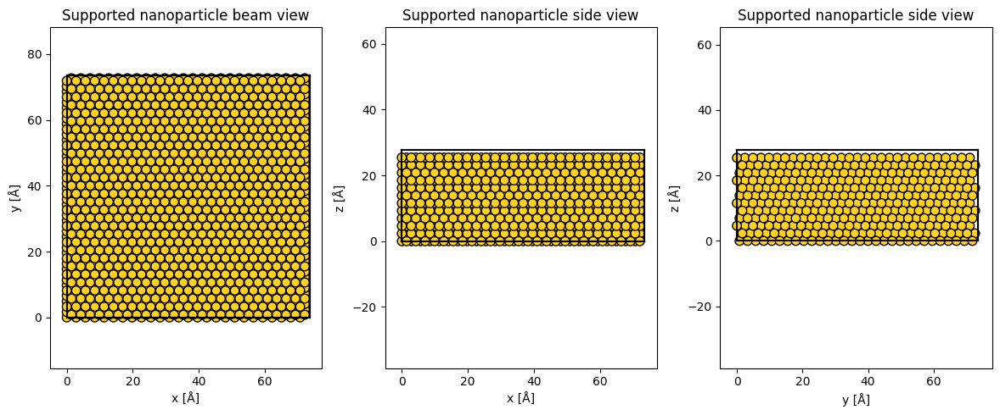

In [3]:
lc = 4
layer_thickness = lc * np.sqrt(3)/3
z_layers = 12
atoms = ase.build.fcc111(
    "Au",
    a = lc,
    size=(1,2,z_layers),
    orthogonal=True,
    periodic=True,
)

atoms *= (26,15,1)
# atoms *= (38,22,1)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 5))
abtem.show_atoms(
    atoms ,
    ax=ax1,
    title="Supported nanoparticle beam view",
    merge=0.1,
    scale=1,
)
abtem.show_atoms(
    atoms ,
    ax=ax2,
    plane="xz",
    scale=1,
    title="Supported nanoparticle side view",
    merge=0.1,
)
abtem.show_atoms(
    atoms ,
    ax=ax3,
    plane="yz",
    scale=1,
    title="Supported nanoparticle side view",
    merge=0.1,
)
fig.tight_layout();

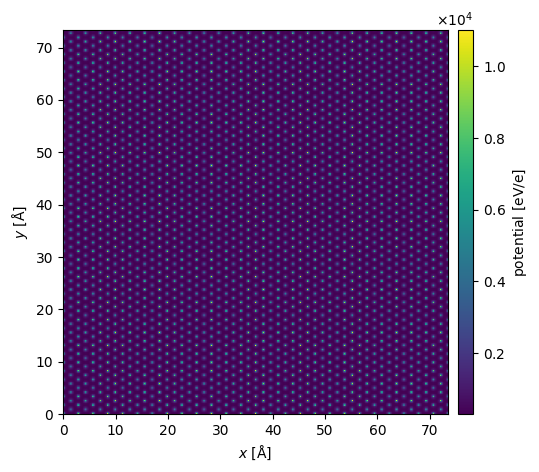

In [28]:
potential = abtem.Potential(
    atoms,
    gpts=(512,512),
    slice_thickness= layer_thickness,
    device='cpu',
    projection='infinite'
).build(
    lazy=False
)

potential.show(
    cbar=True,
    figsize=(6,6)
);

tasks:   0%|          | 0/2 [00:00<?, ?it/s]

tasks:   0%|          | 0/2 [00:00<?, ?it/s]

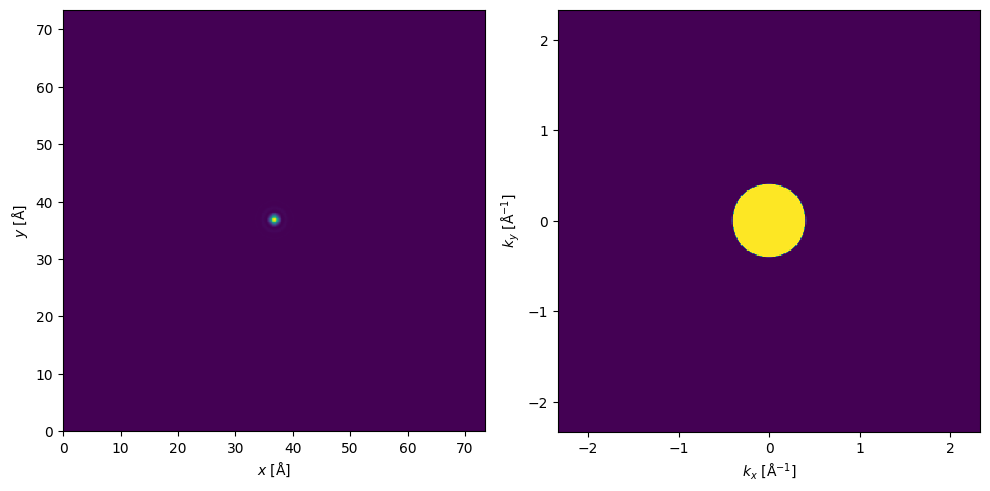

In [29]:
energy = 300e3
# semiangle_cutoff = [8,12,16]
semiangle_cutoff = 8

aberrations = {
    "C10":0,
    # "C12":200,
    # "C21":30000
}

probe = abtem.Probe(
    energy=energy,
    semiangle_cutoff=semiangle_cutoff,
    aberrations=aberrations,
    device='cpu',
).match_grid(
    potential
)

fig, axs = plt.subplots(1,2,figsize=(10,5))
probe.show(ax=axs[0])
probe.build().diffraction_patterns().show(ax=axs[1],explode=True)
fig.tight_layout()



[ 72.12429802  72.6672119  107.09623404]
[72.12489168 72.6681957  25.40341184]


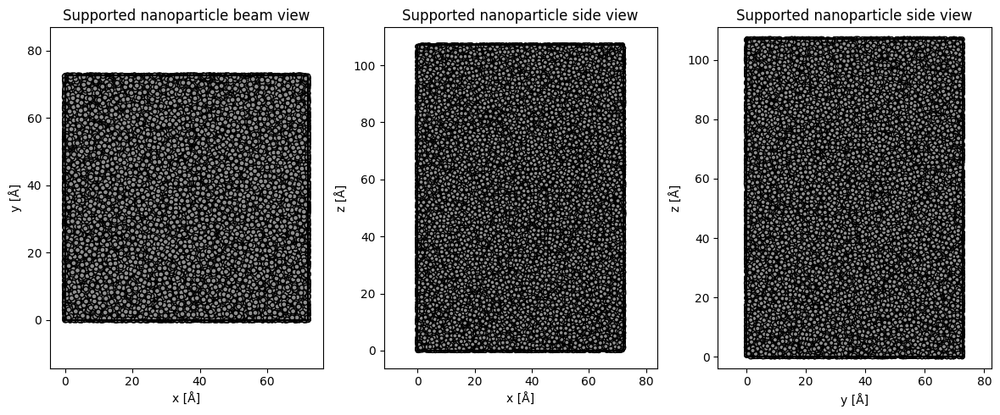

In [30]:
substrate = ase.build.bulk("C", cubic=True)

# Make it large enough to cover the nanoparticle x/y extent

C_layers = 30
substrate = substrate * (30, 30, C_layers)  # larger in x/y

bl = 1.54
rng = np.random.default_rng(seed=10)
substrate.positions[:] += rng.normal(size=(len(substrate), 3)) * 0.5 * bl
substrate.wrap()

# Get the nanoparticle x/y extent
xy_max = atoms.positions.max(axis=0)  # [x_max, y_max, z_max]
xy_min = atoms.positions.min(axis=0)  # [x_min, y_min, z_min]

# Crop substrate to nanoparticle x/y footprint
mask = (
    (substrate.positions[:, 0] >= xy_min[0]) & (substrate.positions[:, 0] <= xy_max[0]) &
    (substrate.positions[:, 1] >= xy_min[1]) & (substrate.positions[:, 1] <= xy_max[1])
)
substrate = substrate[mask]

# Reset cell to match the actual atom extents (no leftover vacuum)
pos_min = substrate.positions.min(axis=0)
pos_max = substrate.positions.max(axis=0)

# Shift positions to start at 0
substrate.positions -= pos_min

# Set cell to exactly the atom extent
substrate.set_cell([
    pos_max[0] - pos_min[0],
    pos_max[1] - pos_min[1],
    substrate.get_cell()[2, 2],  # keep z unchanged
])

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 5))
abtem.show_atoms(
    substrate ,
    ax=ax1,
    title="Supported nanoparticle beam view",
    merge=0.1,
    scale=1,
)
abtem.show_atoms(
    substrate ,
    ax=ax2,
    plane="xz",
    scale=1,
    title="Supported nanoparticle side view",
    merge=0.1,
)
abtem.show_atoms(
    substrate ,
    ax=ax3,
    plane="yz",
    scale=1,
    title="Supported nanoparticle side view",
    merge=0.1,
)
fig.tight_layout();

print(substrate.positions.max(axis=0)) #max size x,y,z
print(atoms.positions.max(axis=0)) #max size x,y,z

In [31]:
# Match substrate cell x/y to atoms cell
substrate.set_cell([
    atoms.get_cell()[0, 0],  # match x
    atoms.get_cell()[1, 1],  # match y
    substrate.get_cell()[2, 2],  # keep substrate z
], scale_atoms=True)  # scale_atoms=True stretches atom positions to fit new cell
atoms_shifted = atoms.copy()
atoms_shifted.positions += [0, 0, substrate.positions.max(axis=0)[2] + 1]

supported_slab = substrate + atoms_shifted

# Set cell to contain everything
supported_slab.set_cell([
    atoms.get_cell()[0, 0],
    atoms.get_cell()[1, 1],
    supported_slab.positions.max(axis=0)[2],
])

# Match substrate cell x/y to atoms cell
substrate.set_cell([
    atoms.get_cell()[0, 0],  # match x
    atoms.get_cell()[1, 1],  # match y
    substrate.get_cell()[2, 2],  # keep substrate z
], scale_atoms=True)  # scale_atoms=True stretches atom positions to fit new cell
atoms_shifted = atoms.copy()
substrate.positions += [0, 0, atoms.positions.max(axis=0)[2] + 1]
# atoms_shifted.center()
supported_slab_reversed = substrate + atoms_shifted
# Set cell to contain everything
supported_slab.set_cell([
    atoms.get_cell()[0, 0],
    atoms.get_cell()[1, 1],
    supported_slab.positions.max(axis=0)[2],
])


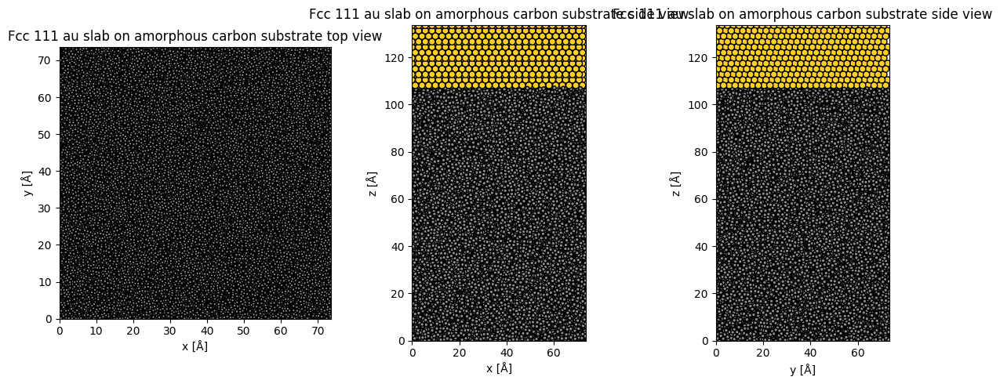

In [32]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 5))
abtem.show_atoms(
    supported_slab ,
    ax=ax1,
    plane="xy",
    title="Fcc 111 au slab on amorphous carbon substrate top view",
    merge=0.1,
    scale=0.5,
    tight_limits=True
)
abtem.show_atoms(
    supported_slab ,
    ax=ax2,
    plane="xz",
    scale=1,
    title="Fcc 111 au slab on amorphous carbon substrate side view",
    merge=0.1,
    tight_limits=True
)
abtem.show_atoms(
    supported_slab ,
    ax=ax3,
    plane="yz",
    scale=1,
    title="Fcc 111 au slab on amorphous carbon substrate side view",
    merge=0.1,
    tight_limits=True
)
fig.tight_layout();

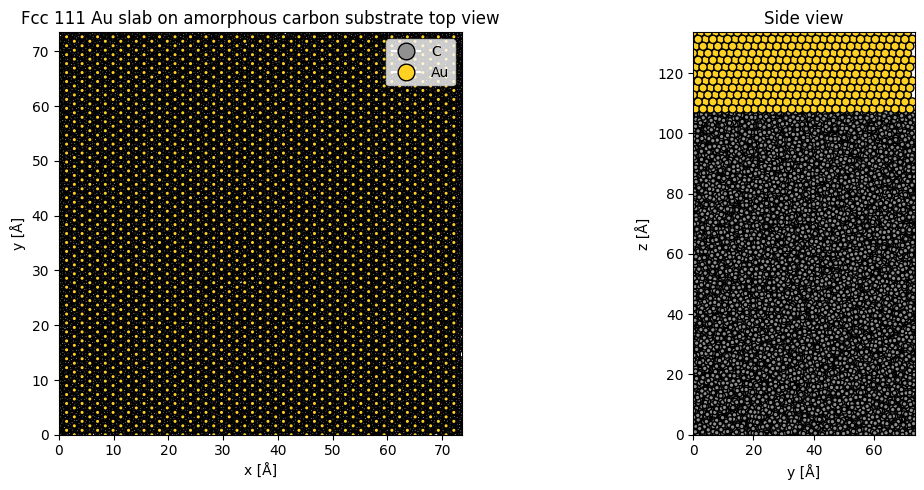

In [33]:
fig, (ax1, ax3) = plt.subplots(1, 2, figsize=(12, 5))
abtem.show_atoms(
    supported_slab_reversed ,
    ax=ax1,
    plane="xy",
    title="Fcc 111 Au slab on amorphous carbon substrate top view",
    merge=0.1,
    scale=0.3,
    tight_limits=True,
    legend=True
)
# abtem.show_atoms(
#     supported_slab ,
#     ax=ax2,
#     plane="xz",
#     scale=1,
#     title="Fcc 111 au slab on amorphous carbon substrate side view",
#     merge=0.1,
#     tight_limits=True
# )
abtem.show_atoms(
    supported_slab ,
    ax=ax3,
    plane="yz",
    scale=1,
    title="Side view",
    merge=0.1,
    tight_limits=True
)
fig.tight_layout();

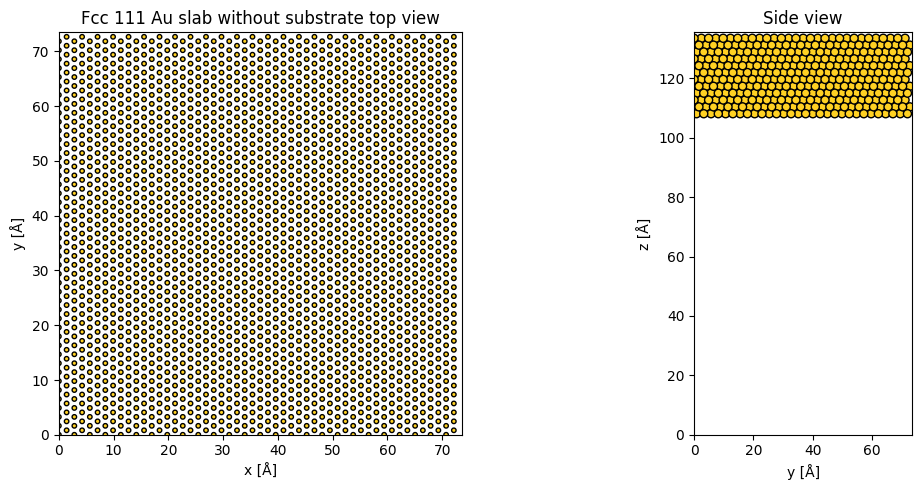

In [34]:
au_slab_only = supported_slab[supported_slab.get_atomic_numbers() == 79]  # 79 = Au
au_slab_only = supported_slab[supported_slab.get_atomic_numbers() == 79].copy()
au_slab_only.set_cell([
    supported_slab.get_cell()[0, 0],
    supported_slab.get_cell()[1, 1],
    au_slab_only.positions[:, 2].max() + 2,  # small vacuum pad on top
])

fig, (ax1, ax3) = plt.subplots(1, 2, figsize=(12, 5))
abtem.show_atoms(
    au_slab_only ,
    ax=ax1,
    plane="xy",
    title="Fcc 111 Au slab without substrate top view",
    merge=0.1,
    scale=0.3,
    tight_limits=True
)
# abtem.show_atoms(
#     au_slab_only ,
#     ax=ax2,
#     plane="xz",
#     scale=1,
#     title="Fcc 111 au slab on amorphous carbon substrate side view",
#     merge=0.1,
#     tight_limits=True
# )
abtem.show_atoms(
    au_slab_only ,
    ax=ax3,
    plane="yz",
    scale=1,
    title="Side view",
    merge=0.1,
    tight_limits=True
)
fig.tight_layout();

## actual measurement patterns

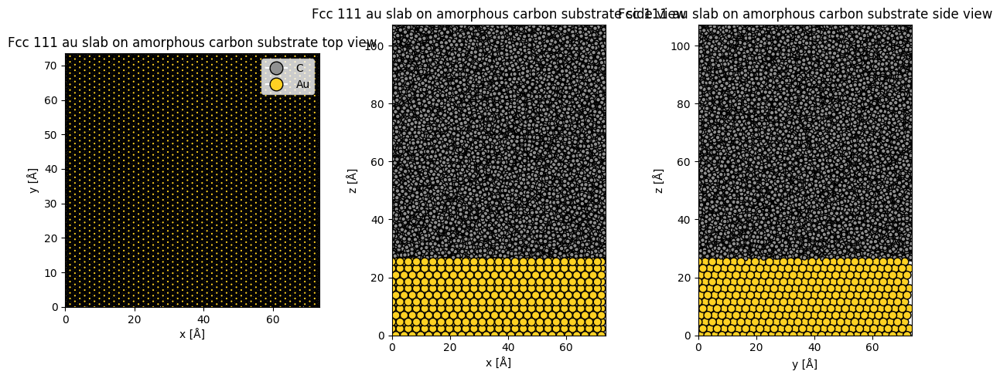

In [10]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 5))
abtem.show_atoms(
    supported_slab_reversed ,
    ax=ax1,
    plane="xy",
    title="Fcc 111 au slab on amorphous carbon substrate top view",
    merge=0.1,
    scale=0.3,
    tight_limits=True,
    legend=True
)
abtem.show_atoms(
    supported_slab_reversed ,
    ax=ax2,
    plane="xz",
    scale=1,
    title="Fcc 111 au slab on amorphous carbon substrate side view",
    merge=0.1,
    tight_limits=True
)
abtem.show_atoms(
    supported_slab_reversed ,
    ax=ax3,
    plane="yz",
    scale=1,
    title="Fcc 111 au slab on amorphous carbon substrate side view",
    merge=0.1,
    tight_limits=True
)
fig.tight_layout();

In [5]:
potential = abtem.Potential(
    supported_slab_reversed,
    gpts=(512,512),
    slice_thickness= layer_thickness,
    device='cpu',
    projection='infinite'
).build(
    lazy=False
)

potential.show(
    cbar=True,
    figsize=(6,6)
);

NameError: name 'supported_slab_reversed' is not defined

In [5]:
energy = 30e3
# semiangle_cutoff = [8,12,16]
semiangle_cutoff = 6

aberrations = {
    "C10":0,
    # "C12":200,
    # "C21":30000
}

probe = abtem.Probe(
    energy=energy,
    semiangle_cutoff=semiangle_cutoff,
    aberrations=aberrations,
    device='cpu',
).match_grid(
    potential
)

fig, axs = plt.subplots(1,2,figsize=(10,5))
probe.show(ax=axs[0])
probe.build().diffraction_patterns().show(ax=axs[1],explode=True)
fig.tight_layout()



NameError: name 'potential' is not defined

In [6]:
start = np.array([0,0])
end = np.array(potential.extent)
gpts = 128

grid_scan = abtem.GridScan(
    start=start,
    end=end,
    gpts=(gpts, gpts),
    endpoint=False
)

detector = abtem.PixelatedDetector(
    max_angle=None
)

NameError: name 'potential' is not defined

In [35]:
measurement = probe.scan(
    potential,
    grid_scan,
    detector,
).compute()

tasks:   0%|          | 0/306 [00:00<?, ?it/s]

In [53]:
dose = 1e3


In [54]:
intensity_measurement_noisy = measurement.crop(gpts=(256,256)).poisson_noise(dose)
dataset_noisy = intensity_measurement_noisy.to_quantem()
dataset_noisy.save(f"/home/wdekleijne/git-repos/willem-playground/data/au_slabon(under)aC_{z_layers}zlayers_{semiangle_cutoff}mrad_{energy/1000:.1e}kev_{dose:.0e}dose_gpts{gpts}_256x256.zip",mode='o')

## Reconstruct

In [7]:
gpts = 128
dose=1e7

filepath = Path(f"/home/wdekleijne/git-repos/willem-playground/data/au_slabon(under)aC_{z_layers}zlayers_{semiangle_cutoff}mrad_{energy/1000:.1e}kev_{dose:.0e}dose_gpts{gpts}_256x256.zip")
# filepath = Path(f"/home/wdekleijne/git-repos/willem-playground/data/au_slab_{z_layers}zlayers_28mrad_{energy/1000:.1e}kev_{dose:.0e}dose_gpts173.0_256x256.zip")

dset_6= em.io.load(filepath)

PROBE_ENERGY = energy # eV
PROBE_SEMIANGLE_6 = semiangle_cutoff # mrad
PROBE_DEFOCUS = 0 # A 

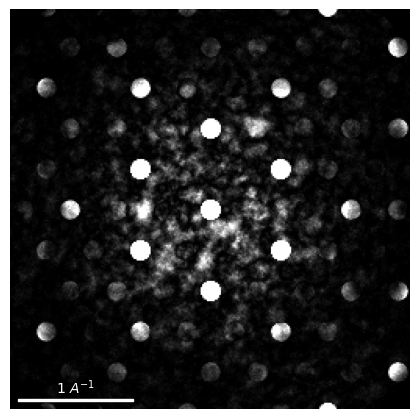

In [8]:
fig, ax = plt.subplots(figsize=(4, 4))
ax.imshow(real_array_to_rgba(dset_6.array[2, 1]), interpolation=None)
ax.axis('off')

scalebar_real = em.visualization.ScalebarConfig(
    sampling=dset_6.sampling[3],
    units='$A^{-1}$',
    length=1
)
em.visualization.visualization_utils.add_scalebar_to_ax(
    ax,
    dset_6.shape[3],
    scalebar_real.sampling,
    scalebar_real.length,
    scalebar_real.units,
    scalebar_real.width_px,
    scalebar_real.pad_px,
    color='white',
    loc='lower left'
)

fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
plt.show()

In [9]:
pdset_6 = PtychographyDatasetRaster.from_dataset4dstem(dset_6)#, wave_ground_truth=dset_wave_ground_truth)
aberrations = {
    "C10":0,
}

probe_params = {
    "energy": PROBE_ENERGY,
    "C10": aberrations["C10"],
    "semiangle_cutoff": PROBE_SEMIANGLE_6,
}

pdset_6.preprocess(
    force_com_rotation=0,
    force_com_transpose=0,
    plot_com=False,
    probe_energy=PROBE_ENERGY,
    com_fit_function='no_shift'
)

obj_model_pix = ObjectPixelated.from_uniform( # also from_array and from_random 
    obj_type="complex",
    num_slices=1,
)

probe_model_pix = ProbePixelated.from_params(
    probe_params=probe_params,
)

detector_model = DetectorPixelated()

from quantem.diffractive_imaging.logger_ptychography import LoggerPtychography

# logger = None
logger_pix = LoggerPtychography(
    log_dir = "./logs",
    run_prefix=dset_6.name,
    run_suffix="pix",
    log_images_every=10,
    log_probe_images=False,
)

ptycho_pix_6 = Ptychography.from_models( 
    dset=pdset_6,
    obj_model=obj_model_pix,
    probe_model=probe_model_pix,
    detector_model=detector_model,
    logger=logger_pix,
    rng=42,
    #wave_ground_truth=dset_wave_ground_truth,
)

ptycho_pix_6.preprocess(
    obj_padding_px=(0, 0),
    val_ratio=0.0,
)

Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to 0.


Normalizing intensities:   0%|          | 0/16384 [00:00<?, ?probe position/s]

Missing probe parameter 'defocus' in probe_params


  0%|          | 0/125 [00:00<?, ?it/s]

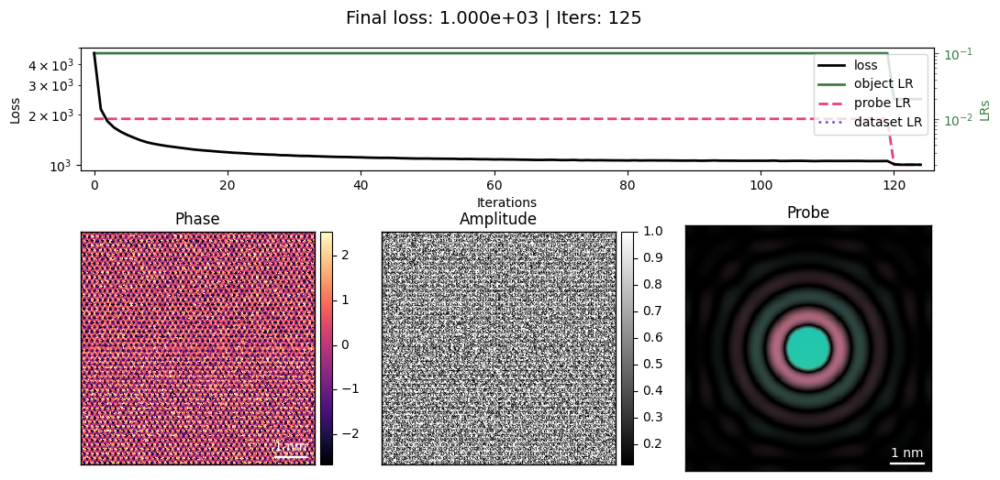

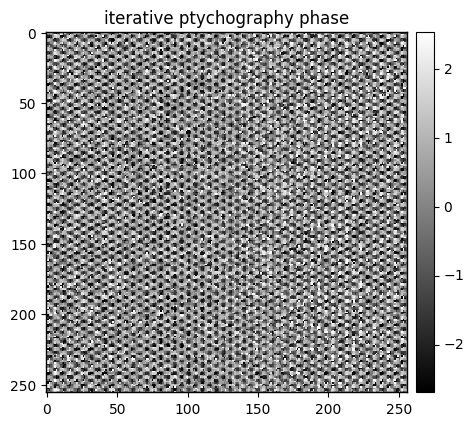

In [10]:

opt_params = {
        "object": {
            "type": "adamw", 
            "lr": 1e-1, 
        },
        "probe": {
            "type": "adamw", 
            "lr": 1e-2, 
        },
        "dataset": { ### for optimizing over descan shifts and probe positions
            "type": "adamw",
            "lr": 0.0,
        }
}


# opt_params = {
#         "object": {
#             "type": "adamw", 
#             "lr": 0.5e-1, 
#         },
#         "probe": {
#             "type": "adamw", 
#             "lr": 1e-3, 
#         },
#         "dataset": { ### for optimizing over descan shifts and probe positions
#             "type": "adamw",
#             "lr": 0.0,
#         }
# }


scheduler_params = {
    "object": { ## scheduler kwargs are passed to the scheduler (of type type)
        "type": "plateau", ## i like plateau for many cases
        "factor":0.2,

    },
    "probe": {
        "type": "plateau",
        "factor":0.2,

    },
    "dataset": { 
        "type": "plateau",  ## exp is also frequently used 
        "factor":0.2,
    }
}

constraints_stage1 = {
    # "object": {
    #     # "gaussian_sigma": 2.0,      # was "gaussian_filter_sigma" + "gaussian_filter"
    # },
}


ptycho_pix_reconstruct_6 = ptycho_pix_6.reconstruct(
    num_iters=125,
    reset=True,
    optimizer_params=opt_params,
    scheduler_params=scheduler_params,
    constraints=constraints_stage1, 
    batch_size=16384//64,
    device="cuda:1",
    store_snapshots_every=1,
    autograd=False,
    autograd_random=False,
    disk_phase='disk_phase'
)

ptycho_pix_reconstruct_6.visualize()

em.visualization.show_2d(
    [
        [
            np.rot90(np.angle(ptycho_pix_reconstruct_6.obj[0]),k=1),
        ],
    ],
    title=[
        ["iterative ptychography phase"],
    ],
    axsize=(5,5),
    cbar=True,
    show_ticks=True
    
);


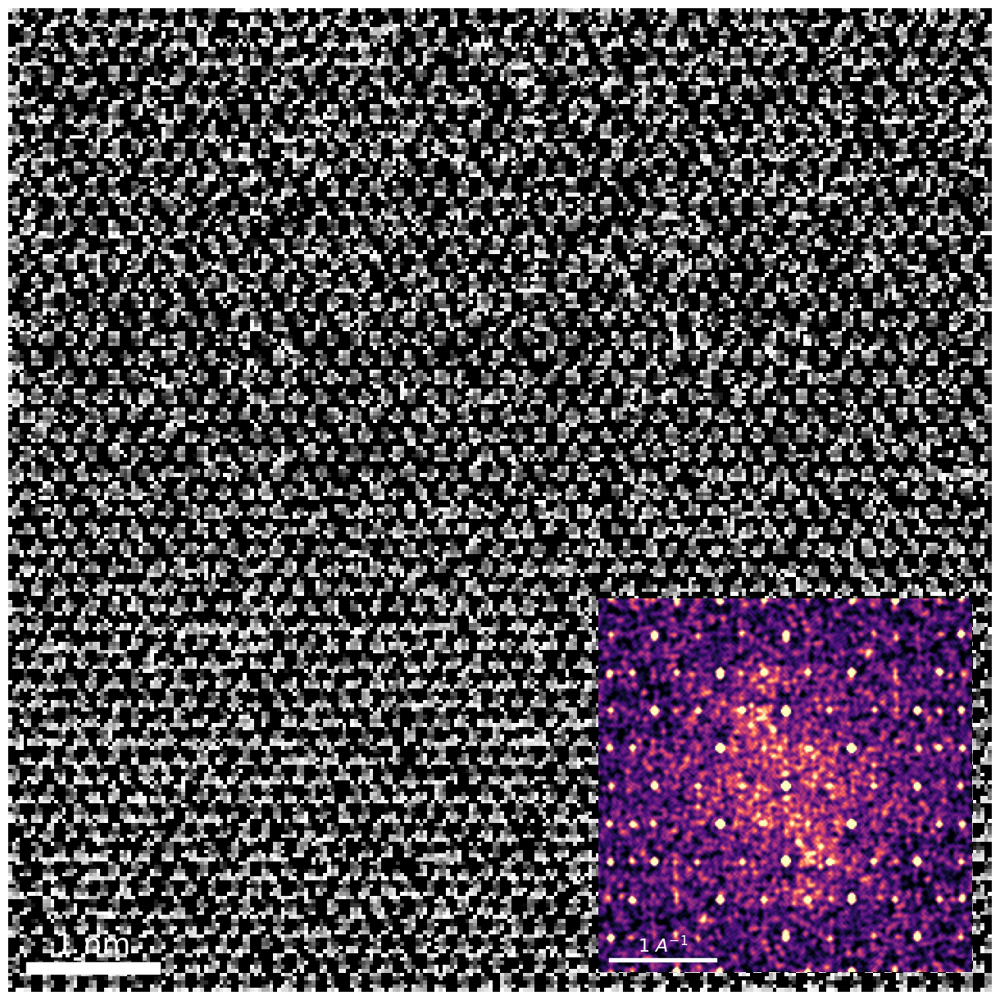

In [11]:
norm_fft = NormalizationConfig(
    interval_type='manual',
    stretch_type='power',
    power=0.5
)

phase = np.angle(-ptycho_pix_reconstruct_6.obj[0]).clip(0)

# Build a 2D Hann window
H, W = phase.shape
window = np.outer(hann(H), hann(W))

phase_windowed = phase * window

fft_mag = np.fft.fftshift(np.abs(np.fft.fft2(phase_windowed)))


fft_mag = np.fft.fftshift(np.abs(np.fft.fft2(phase_windowed)))
fft_mag[H//2, W//2] = 0

# Convolve with small disk — increase radius for more spreading
kernel = disk(2).astype(float)
kernel /= kernel.sum()
fft_mag = convolve(fft_mag, kernel)


rgba_main = real_array_to_rgba(phase)
rgba_fft = real_array_to_rgba(fft_mag, cmap='magma')

# Compose the final figure
fig, ax = plt.subplots(figsize=(12, 12))
ax.imshow(rgba_main,interpolation=None)
ax.axis('off')

scalebar_real = em.visualization.ScalebarConfig(
    sampling = ptycho_pix_reconstruct_6.sampling[1],
    units = 'A',
    length = 10,
)

em.visualization.visualization_utils.add_scalebar_to_ax(
    ax,
    ptycho_pix_reconstruct_6.obj[0].shape[1],
    scalebar_real.sampling,
    scalebar_real.length,
    scalebar_real.units,
    scalebar_real.width_px+2,
    scalebar_real.pad_px,
    color='white',
    loc='lower left',
    fontsize=26
)

inset_ax = fig.add_axes([0.60, 0.02, 0.38, 0.38])
inset_ax.imshow(rgba_fft)
inset_ax.axis('off')

fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

scalebar_real = em.visualization.ScalebarConfig(
    sampling=dset_6.sampling[3],
    units='$A^{-1}$',
    length=1
)
em.visualization.visualization_utils.add_scalebar_to_ax(
    inset_ax,
    dset_6.shape[3],
    scalebar_real.sampling,
    scalebar_real.length,
    scalebar_real.units,
    scalebar_real.width_px+1,
    scalebar_real.pad_px,
    color='white',
    loc='lower left',
    fontsize=16
)


## 1e15

128


(<Figure size 400x400 with 1 Axes>, <Axes: >)

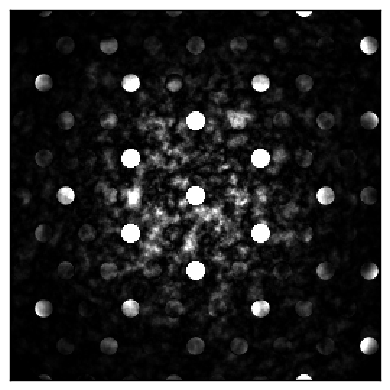

In [12]:
energy = 30e3
semiangle_cutoff = 6
z_layers = 12
gpts = 128
dose = 1e15
print(gpts)

filepath_18 = Path(f"/home/wdekleijne/git-repos/willem-playground/data/au_slabon(under)aC_{z_layers}zlayers_{semiangle_cutoff}mrad_{energy/1000:.1e}kev_{dose:.0e}dose_gpts{gpts}_256x256.zip")
# filepath = Path(f"/home/wdekleijne/git-repos/willem-playground/data/au_slab_{z_layers}zlayers_28mrad_{energy/1000:.1e}kev_{dose:.0e}dose_gpts173.0_256x256.zip")

dset_18 = em.io.load(filepath_18)

PROBE_ENERGY = energy # eV
PROBE_SEMIANGLE_18 = semiangle_cutoff # mrad
PROBE_DEFOCUS = 0 # A 

show_2d(dset_18.array[1,2])

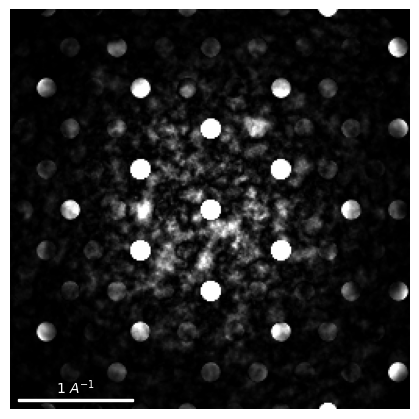

In [13]:
fig, ax = plt.subplots(figsize=(4, 4))
ax.imshow(real_array_to_rgba(dset_18.array[2, 1]), interpolation=None)
ax.axis('off')

scalebar_real = em.visualization.ScalebarConfig(
    sampling=dset_18.sampling[3],
    units='$A^{-1}$',
    length=1
)
em.visualization.visualization_utils.add_scalebar_to_ax(
    ax,
    dset_18.shape[3],
    scalebar_real.sampling,
    scalebar_real.length,
    scalebar_real.units,
    scalebar_real.width_px,
    scalebar_real.pad_px,
    color='white',
    loc='lower left'
)

fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
plt.show()

In [14]:
pdset_18 = PtychographyDatasetRaster.from_dataset4dstem(dset_18)#, wave_ground_truth=dset_wave_ground_truth)
aberrations = {
    "C10":0,
}

probe_params = {
    "energy": PROBE_ENERGY,
    "C10": aberrations["C10"],
    "semiangle_cutoff": PROBE_SEMIANGLE_18,
}

pdset_18.preprocess(
    force_com_rotation=0,
    force_com_transpose=0,
    plot_com=False,
    probe_energy=PROBE_ENERGY,
    com_fit_function='no_shift'
)

obj_model_pix = ObjectPixelated.from_uniform( # also from_array and from_random 
    obj_type="complex",
    num_slices=1,
)

probe_model_pix = ProbePixelated.from_params(
    probe_params=probe_params,
)

detector_model = DetectorPixelated()

from quantem.diffractive_imaging.logger_ptychography import LoggerPtychography

# logger = None
logger_pix = LoggerPtychography(
    log_dir = "./logs",
    run_prefix=dset_18.name,
    run_suffix="pix",
    log_images_every=10,
    log_probe_images=False,
)

ptycho_pix_18 = Ptychography.from_models( 
    dset=pdset_18,
    obj_model=obj_model_pix,
    probe_model=probe_model_pix,
    detector_model=detector_model,
    logger=logger_pix,
    rng=42,
    #wave_ground_truth=dset_wave_ground_truth,
)

ptycho_pix_18.preprocess(
    obj_padding_px=(0, 0),
    val_ratio=0.0,
)

Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to 0.


Normalizing intensities:   0%|          | 0/16384 [00:00<?, ?probe position/s]

Missing probe parameter 'defocus' in probe_params


  0%|          | 0/125 [00:00<?, ?it/s]

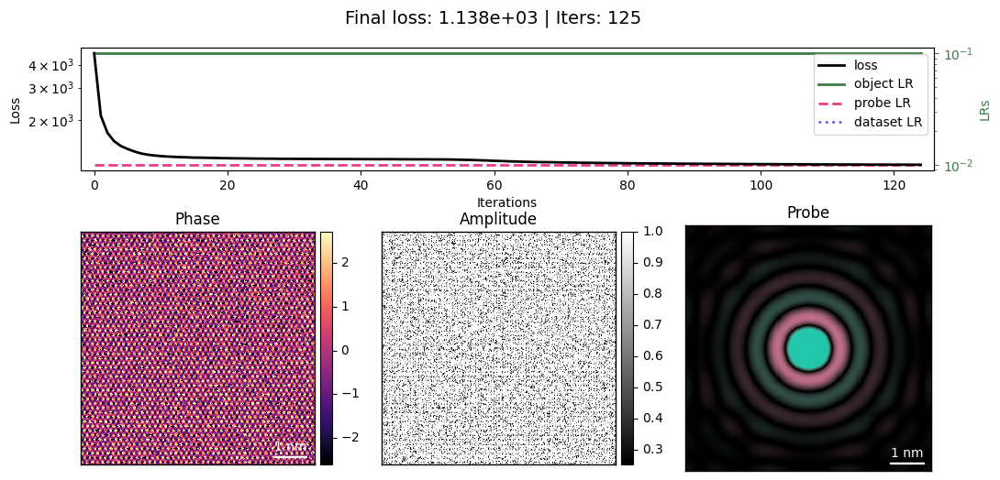

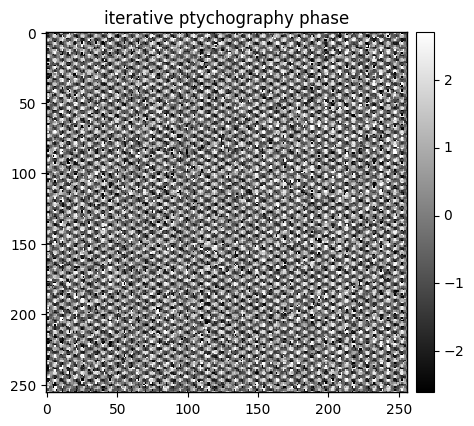

In [15]:

opt_params = {
        "object": {
            "type": "adamw", 
            "lr": 1e-1, 
        },
        "probe": {
            "type": "adamw", 
            "lr": 1e-2, 
        },
        "dataset": { ### for optimizing over descan shifts and probe positions
            "type": "adamw",
            "lr": 0.0,
        }
}


scheduler_params = {
    "object": { ## scheduler kwargs are passed to the scheduler (of type type)
        "type": "plateau", ## i like plateau for many cases
        "factor":0.2,

    },
    "probe": {
        "type": "plateau",
        "factor":0.2,

    },
    "dataset": { 
        "type": "plateau",  ## exp is also frequently used 
        "factor":0.2,
    }
}

constraints_stage1 = {
    # "object": {
    #     # "gaussian_sigma": 2.0,      # was "gaussian_filter_sigma" + "gaussian_filter"
    # },
}


ptycho_pix_reconstruct_18 = ptycho_pix_18.reconstruct(
    num_iters=125,
    reset=True,
    optimizer_params=opt_params,
    scheduler_params=scheduler_params,
    constraints=constraints_stage1, 
    batch_size=16384//64,
    device="cuda:1",
    store_snapshots_every=1,
    autograd=False,
    autograd_random=False,
    disk_phase='disk_phase'
)

ptycho_pix_reconstruct_18.visualize()

em.visualization.show_2d(
    [
        [
            np.rot90(np.angle(ptycho_pix_reconstruct_18.obj[0]),k=1),
        ],
    ],
    title=[
        ["iterative ptychography phase"],
    ],
    axsize=(5,5),
    cbar=True,
    show_ticks=True
    
);


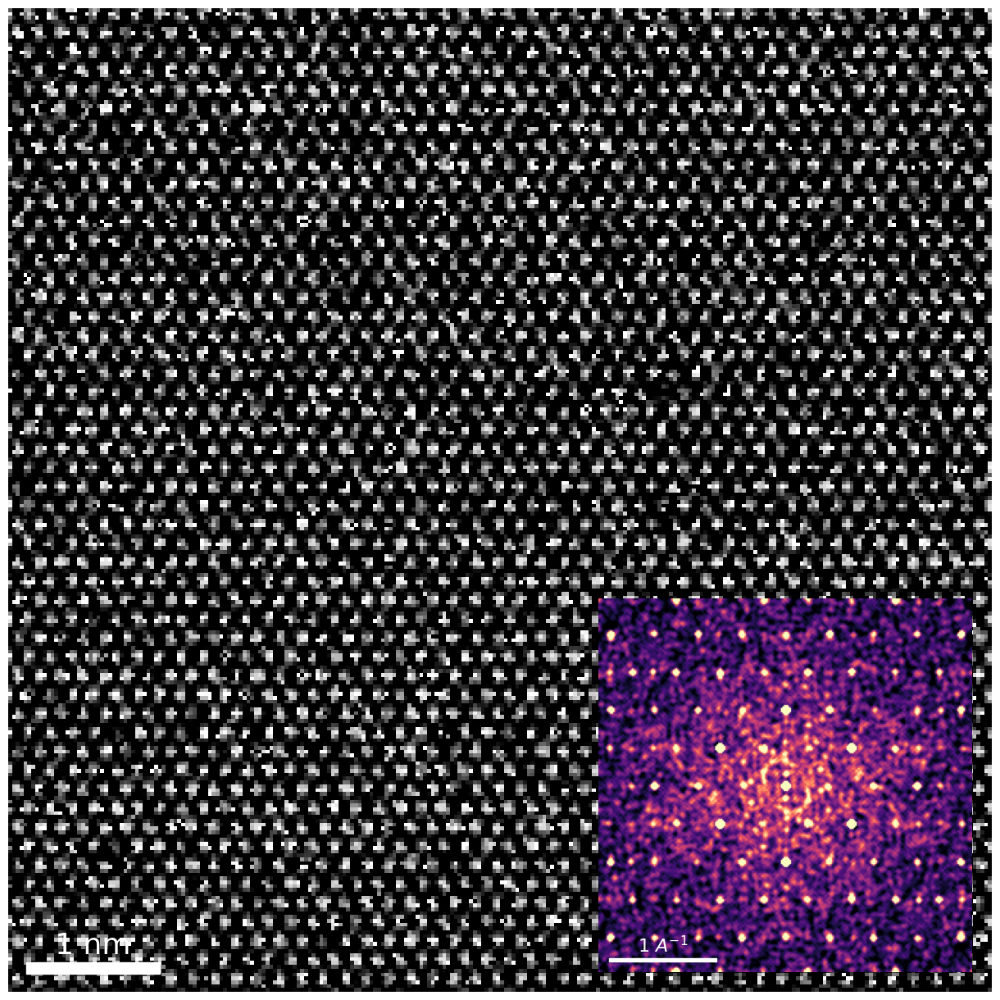

In [16]:
norm_fft = NormalizationConfig(
    interval_type='manual',
    stretch_type='power',
    power=0.5
)

phase = np.angle(ptycho_pix_reconstruct_18.obj[0]).clip(0)

# Build a 2D Hann window
H, W = phase.shape
window = np.outer(hann(H), hann(W))

phase_windowed = phase * window

fft_mag = np.fft.fftshift(np.abs(np.fft.fft2(phase_windowed)))


fft_mag = np.fft.fftshift(np.abs(np.fft.fft2(phase_windowed)))
fft_mag[H//2, W//2] = 0

# Convolve with small disk — increase radius for more spreading
kernel = disk(2).astype(float)
kernel /= kernel.sum()
fft_mag = convolve(fft_mag, kernel)


rgba_main = real_array_to_rgba(phase)
rgba_fft = real_array_to_rgba(fft_mag, cmap='magma')

# Compose the final figure
fig, ax = plt.subplots(figsize=(12, 12))
ax.imshow(rgba_main,interpolation=None)
ax.axis('off')

scalebar_real = em.visualization.ScalebarConfig(
    sampling = ptycho_pix_reconstruct_6.sampling[1],
    units = 'A',
    length = 10,
)

em.visualization.visualization_utils.add_scalebar_to_ax(
    ax,
    ptycho_pix_reconstruct_6.obj[0].shape[1],
    scalebar_real.sampling,
    scalebar_real.length,
    scalebar_real.units,
    scalebar_real.width_px+2,
    scalebar_real.pad_px,
    color='white',
    loc='lower left',
    fontsize=26
)

inset_ax = fig.add_axes([0.60, 0.02, 0.38, 0.38])
inset_ax.imshow(rgba_fft)
inset_ax.axis('off')

fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

scalebar_real = em.visualization.ScalebarConfig(
    sampling=dset_6.sampling[3],
    units='$A^{-1}$',
    length=1
)
em.visualization.visualization_utils.add_scalebar_to_ax(
    inset_ax,
    dset_6.shape[3],
    scalebar_real.sampling,
    scalebar_real.length,
    scalebar_real.units,
    scalebar_real.width_px+1,
    scalebar_real.pad_px,
    color='white',
    loc='lower left',
    fontsize=16
)


## 1e3

128


(<Figure size 400x400 with 1 Axes>, <Axes: >)

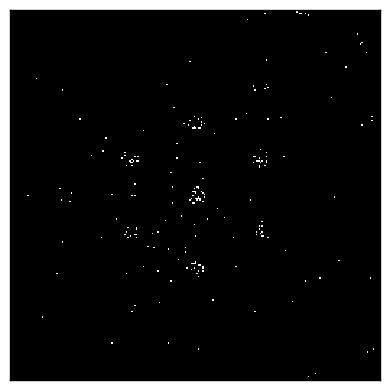

In [17]:
energy = 30e3
semiangle_cutoff = 6
z_layers = 12
gpts = 128
dose = 1e3
print(gpts)

filepath_18 = Path(f"/home/wdekleijne/git-repos/willem-playground/data/au_slabon(under)aC_{z_layers}zlayers_{semiangle_cutoff}mrad_{energy/1000:.1e}kev_{dose:.0e}dose_gpts{gpts}_256x256.zip")
# filepath = Path(f"/home/wdekleijne/git-repos/willem-playground/data/au_slab_{z_layers}zlayers_28mrad_{energy/1000:.1e}kev_{dose:.0e}dose_gpts173.0_256x256.zip")

dset_18 = em.io.load(filepath_18)

PROBE_ENERGY = energy # eV
PROBE_SEMIANGLE_18 = semiangle_cutoff # mrad
PROBE_DEFOCUS = 0 # A 

show_2d(dset_18.array[1,2])

/tmp/ipykernel_92300/1251328585.py:63: RuntimeWarning: invalid value encountered in divide
  scaled_amplitude = (scaled_amplitude - vmin) / (vmax - vmin)


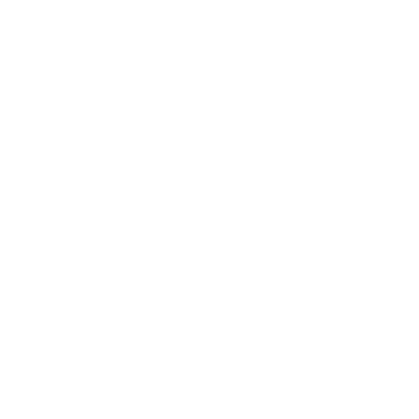

(<Figure size 400x400 with 1 Axes>, <Axes: >)

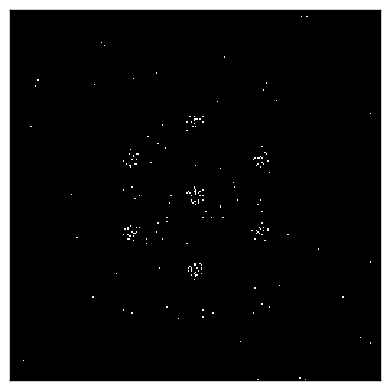

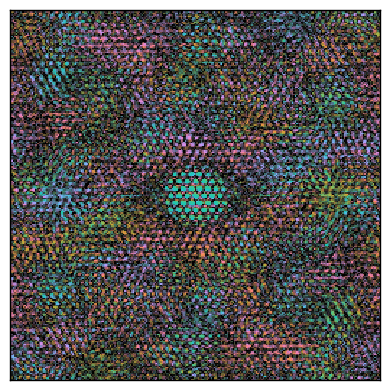

In [18]:
fig, ax = plt.subplots(figsize=(4, 4))
ax.imshow(real_array_to_rgba(dset_18.array[2, 1]), interpolation=None)
ax.axis('off')

scalebar_real = em.visualization.ScalebarConfig(
    sampling=dset_18.sampling[3],
    units='$A^{-1}$',
    length=1
)
em.visualization.visualization_utils.add_scalebar_to_ax(
    ax,
    dset_18.shape[3],
    scalebar_real.sampling,
    scalebar_real.length,
    scalebar_real.units,
    scalebar_real.width_px,
    scalebar_real.pad_px,
    color='white',
    loc='lower left'
)

fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
plt.show()

show_2d(dset_18.array[2,1])
show_2d(np.fft.fftshift(np.fft.ifft2(np.fft.ifftshift(dset_18.array[2,1]))))

In [19]:
pdset_18 = PtychographyDatasetRaster.from_dataset4dstem(dset_18)#, wave_ground_truth=dset_wave_ground_truth)
aberrations = {
    "C10":0,
}

probe_params = {
    "energy": PROBE_ENERGY,
    "C10": aberrations["C10"],
    "semiangle_cutoff": PROBE_SEMIANGLE_18,
}

pdset_18.preprocess(
    force_com_rotation=0,
    force_com_transpose=0,
    plot_com=False,
    probe_energy=PROBE_ENERGY,
    com_fit_function='no_shift'
)

obj_model_pix = ObjectPixelated.from_uniform( # also from_array and from_random 
    obj_type="complex",
    num_slices=1,
)

probe_model_pix = ProbePixelated.from_params(
    probe_params=probe_params,
)

detector_model = DetectorPixelated()

from quantem.diffractive_imaging.logger_ptychography import LoggerPtychography

# logger = None
logger_pix = LoggerPtychography(
    log_dir = "./logs",
    run_prefix=dset_18.name,
    run_suffix="pix",
    log_images_every=10,
    log_probe_images=False,
)

ptycho_pix_18 = Ptychography.from_models( 
    dset=pdset_18,
    obj_model=obj_model_pix,
    probe_model=probe_model_pix,
    detector_model=detector_model,
    logger=logger_pix,
    rng=42,
    #wave_ground_truth=dset_wave_ground_truth,
)

ptycho_pix_18.preprocess(
    obj_padding_px=(0, 0),
    val_ratio=0.0,
)

Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to 0.


Normalizing intensities:   0%|          | 0/16384 [00:00<?, ?probe position/s]

Missing probe parameter 'defocus' in probe_params


  0%|          | 0/25 [00:00<?, ?it/s]

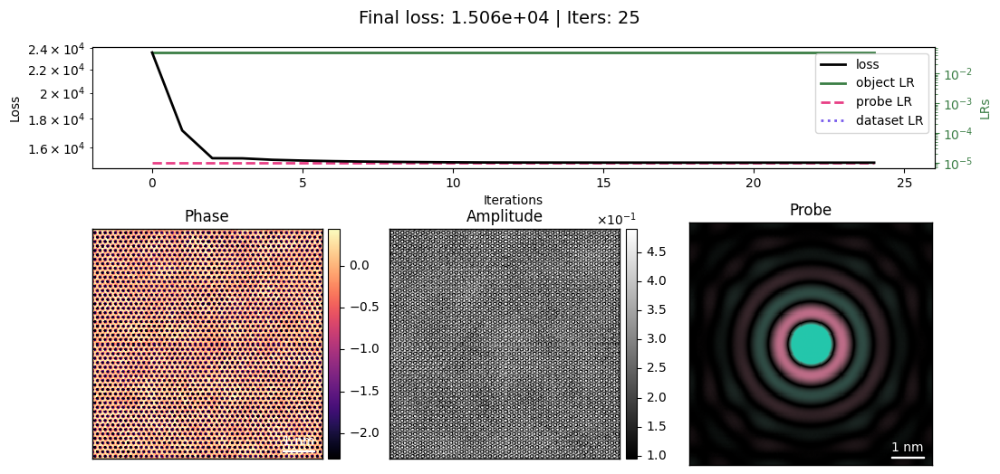

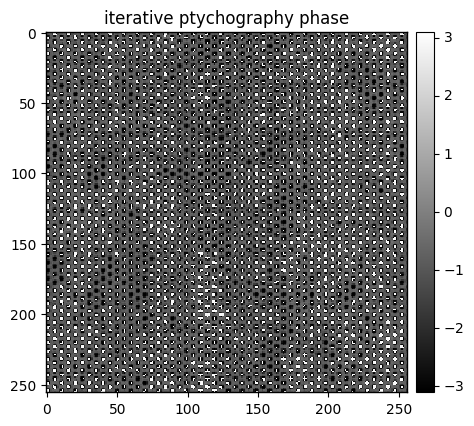

In [21]:

opt_params = {
        "object": {
            "type": "adamw", 
            "lr": 0.5e-1, 
        },
        "probe": {
            "type": "adamw", 
            "lr": 1e-5, 
        },
        "dataset": { ### for optimizing over descan shifts and probe positions
            "type": "adamw",
            "lr": 0.0,
        }
}


scheduler_params = {
    "object": { ## scheduler kwargs are passed to the scheduler (of type type)
        "type": "plateau", ## i like plateau for many cases
        "factor":0.2,

    },
    "probe": {
        "type": "plateau",
        "factor":0.2,

    },
    "dataset": { 
        "type": "plateau",  ## exp is also frequently used 
        "factor":0.2,
    }
}

constraints_stage1 = {
    # "object": {
    #     # "gaussian_sigma": 2.0,      # was "gaussian_filter_sigma" + "gaussian_filter"
    # },
}


ptycho_pix_reconstruct_18 = ptycho_pix_18.reconstruct(
    num_iters=25,
    reset=True,
    optimizer_params=opt_params,
    scheduler_params=scheduler_params,
    constraints=constraints_stage1, 
    batch_size=16384//8,
    device="cuda:1",
    store_snapshots_every=1,
    autograd=False,
    autograd_random=False,
    disk_phase='disk_phase'
)

ptycho_pix_reconstruct_18.visualize()

em.visualization.show_2d(
    [
        [
            np.rot90(np.angle(ptycho_pix_reconstruct_18.obj[0]),k=1),
        ],
    ],
    title=[
        ["iterative ptychography phase"],
    ],
    axsize=(5,5),
    cbar=True,
    show_ticks=True
    
);


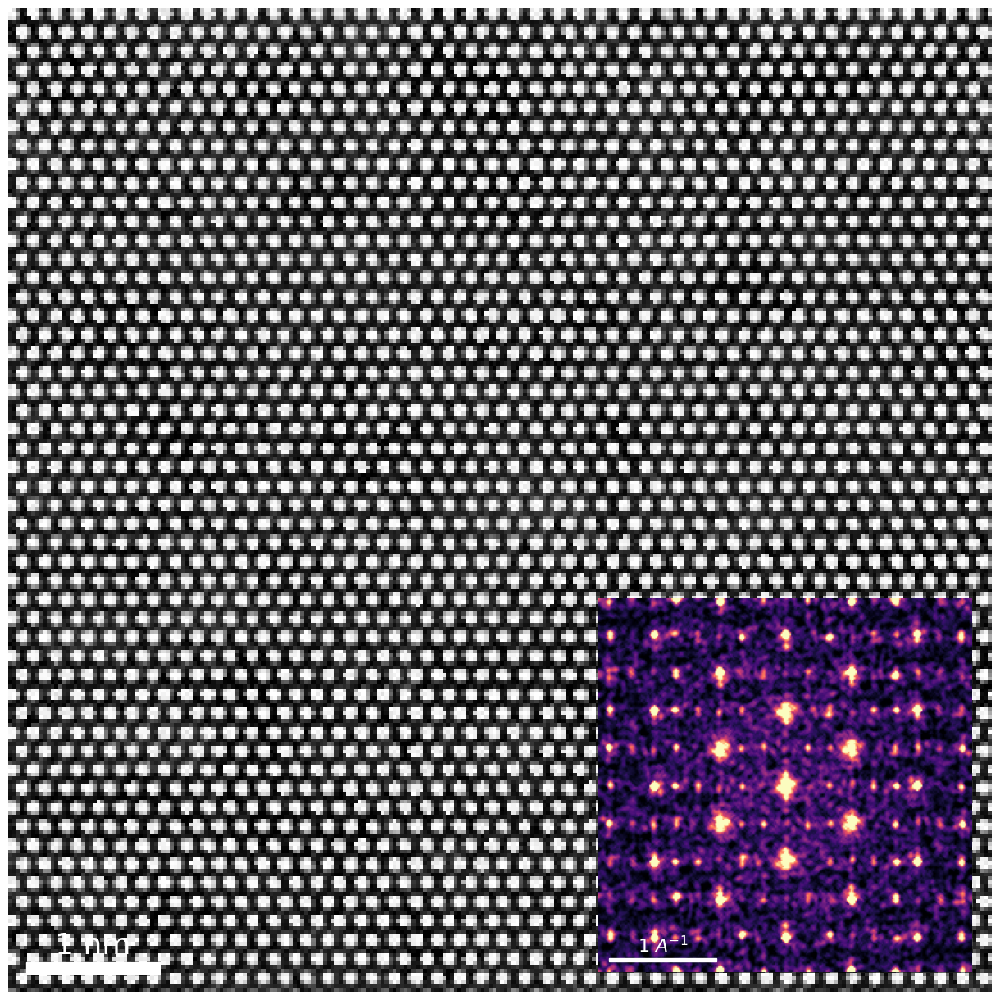

In [24]:
norm_fft = NormalizationConfig(
    interval_type='manual',
    stretch_type='power',
    power=0.5
)

phase = np.angle(ptycho_pix_reconstruct_18.obj[0])

# Build a 2D Hann window
H, W = phase.shape
window = np.outer(hann(H), hann(W))

phase_windowed = phase * window

fft_mag = np.fft.fftshift(np.abs(np.fft.fft2(phase_windowed)))


fft_mag = np.fft.fftshift(np.abs(np.fft.fft2(phase_windowed)))
fft_mag[H//2, W//2] = 0

# Convolve with small disk — increase radius for more spreading
kernel = disk(2).astype(float)
kernel /= kernel.sum()
fft_mag = convolve(fft_mag, kernel)


rgba_main = real_array_to_rgba(phase)
rgba_fft = real_array_to_rgba(fft_mag, cmap='magma')

# Compose the final figure
fig, ax = plt.subplots(figsize=(12, 12))
ax.imshow(rgba_main,interpolation=None)
ax.axis('off')

scalebar_real = em.visualization.ScalebarConfig(
    sampling = ptycho_pix_reconstruct_18.sampling[1],
    units = 'A',
    length = 10,
)

em.visualization.visualization_utils.add_scalebar_to_ax(
    ax,
    ptycho_pix_reconstruct_18.obj[0].shape[1],
    scalebar_real.sampling,
    scalebar_real.length,
    scalebar_real.units,
    scalebar_real.width_px+2,
    scalebar_real.pad_px,
    color='white',
    loc='lower left',
    fontsize=26
)

inset_ax = fig.add_axes([0.60, 0.02, 0.38, 0.38])
inset_ax.imshow(rgba_fft)
inset_ax.axis('off')

fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

scalebar_real = em.visualization.ScalebarConfig(
    sampling=dset_18.sampling[3],
    units='$A^{-1}$',
    length=1
)
em.visualization.visualization_utils.add_scalebar_to_ax(
    inset_ax,
    dset_18.shape[3],
    scalebar_real.sampling,
    scalebar_real.length,
    scalebar_real.units,
    scalebar_real.width_px+1,
    scalebar_real.pad_px,
    color='white',
    loc='lower left',
    fontsize=16
)


## 1e3 no aC

In [6]:
energy = 30e3
semiangle_cutoff = 6
z_layers = 12
dose = 1e3
gpts=128
print(gpts)

filepath_6 = Path(f"/home/wdekleijne/git-repos/willem-playground/data/au_slab_{z_layers}zlayers_{semiangle_cutoff}mrad_{energy/1000:.1e}kev_C10{aberrations["C10"]}_{dose:.0e}dose_gpts{gpts}_256x256.zip")
# filepath = Path(f"/home/wdekleijne/git-repos/willem-playground/data/au_slab_{z_layers}zlayers_28mrad_{energy/1000:.1e}kev_{dose:.0e}dose_gpts173.0_256x256.zip")

dset_6 = em.io.load(filepath_6)

PROBE_ENERGY = energy # eV
PROBE_SEMIANGLE_6 = semiangle_cutoff # mrad
PROBE_DEFOCUS = 0 # A 

128


/tmp/ipykernel_642898/1251328585.py:63: RuntimeWarning: invalid value encountered in divide
  scaled_amplitude = (scaled_amplitude - vmin) / (vmax - vmin)


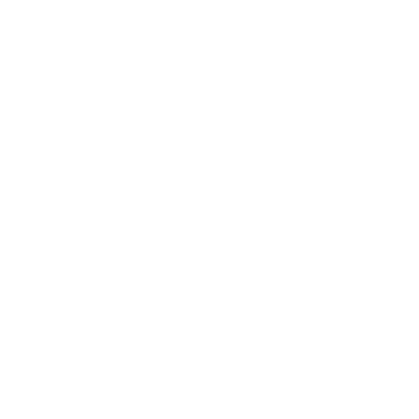

In [7]:
fig, ax = plt.subplots(figsize=(4, 4))
ax.imshow(real_array_to_rgba(dset_6.array[2, 1]), interpolation=None)
ax.axis('off')

# scalebar_real = em.visualization.ScalebarConfig(
#     sampling=dset_6.sampling[3],
#     units='$A^{-1}$',
#     length=1
# )
# em.visualization.visualization_utils.add_scalebar_to_ax(
#     ax,
#     dset_6.shape[3],
#     scalebar_real.sampling,
#     scalebar_real.length,
#     scalebar_real.units,
#     scalebar_real.width_px,
#     scalebar_real.pad_px,
#     color='white',
#     loc='lower left'
# )

fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
plt.show()

In [8]:
pdset_6 = PtychographyDatasetRaster.from_dataset4dstem(dset_6)#, wave_ground_truth=dset_wave_ground_truth)
aberrations = {
    "C10":0,
}

probe_params = {
    "energy": PROBE_ENERGY,
    "C10": aberrations["C10"],
    "semiangle_cutoff": PROBE_SEMIANGLE_6,
}

pdset_6.preprocess(
    force_com_rotation=0,
    force_com_transpose=0,
    plot_com=False,
    probe_energy=PROBE_ENERGY,
    com_fit_function='no_shift'
)

obj_model_pix = ObjectPixelated.from_uniform( # also from_array and from_random 
    obj_type="complex",
    num_slices=1,
)

probe_model_pix = ProbePixelated.from_params(
    probe_params=probe_params,
)

detector_model = DetectorPixelated()

from quantem.diffractive_imaging.logger_ptychography import LoggerPtychography

# logger = None
logger_pix = LoggerPtychography(
    log_dir = "./logs",
    run_prefix=dset_6.name,
    run_suffix="pix",
    log_images_every=10,
    log_probe_images=False,
)

ptycho_pix_6 = Ptychography.from_models( 
    dset=pdset_6,
    obj_model=obj_model_pix,
    probe_model=probe_model_pix,
    detector_model=detector_model,
    logger=logger_pix,
    rng=42,
    #wave_ground_truth=dset_wave_ground_truth,
)

ptycho_pix_6.preprocess(
    obj_padding_px=(0, 0),
    val_ratio=0.0,
)

Forcing best fit rotation to 0 degrees.
Forcing transpose of intensities to 0.


Normalizing intensities:   0%|          | 0/16384 [00:00<?, ?probe position/s]

Missing probe parameter 'defocus' in probe_params


  0%|          | 0/25 [00:00<?, ?it/s]

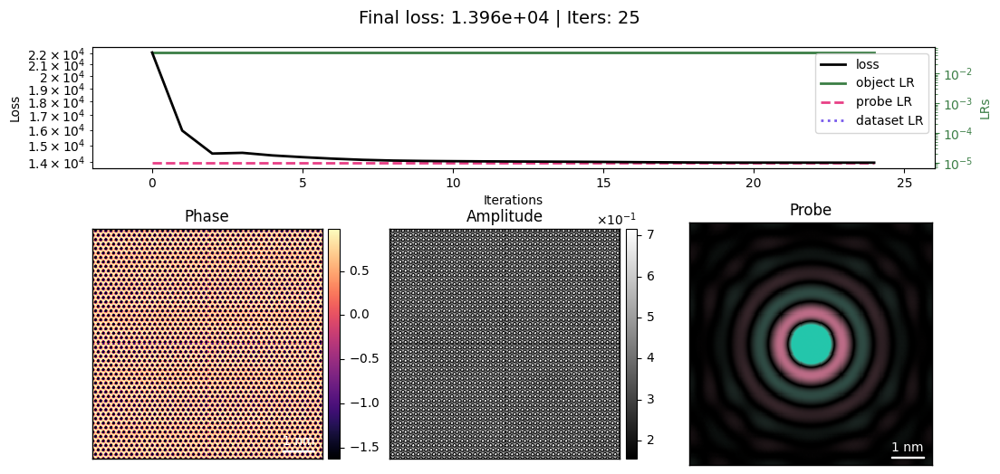

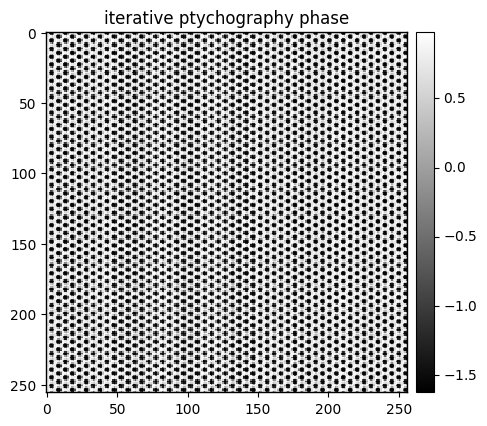

In [9]:

opt_params = {
        "object": {
            "type": "adamw", 
            "lr": 0.5e-1, 
        },
        "probe": {
            "type": "adamw", 
            "lr": 1e-5, 
        },
        "dataset": { ### for optimizing over descan shifts and probe positions
            "type": "adamw",
            "lr": 0.0,
        }
}


scheduler_params = {
    "object": { ## scheduler kwargs are passed to the scheduler (of type type)
        "type": "plateau", ## i like plateau for many cases
        "factor":0.2,

    },
    "probe": {
        "type": "plateau",
        "factor":0.2,

    },
    "dataset": { 
        "type": "plateau",  ## exp is also frequently used 
        "factor":0.2,
    }
}

constraints_stage1 = {
    # "object": {
    #     # "gaussian_sigma": 2.0,      # was "gaussian_filter_sigma" + "gaussian_filter"
    # },
}


ptycho_pix_reconstruct_6 = ptycho_pix_6.reconstruct(
    num_iters=25,
    reset=True,
    optimizer_params=opt_params,
    scheduler_params=scheduler_params,
    constraints=constraints_stage1, 
    batch_size=16384//8,
    device="cuda:1",
    store_snapshots_every=1,
    autograd=False,
    autograd_random=False,
    disk_phase='disk_phase'
)

ptycho_pix_reconstruct_6.visualize()

em.visualization.show_2d(
    [
        [
            np.rot90(np.angle(ptycho_pix_reconstruct_6.obj[0]),k=1),
        ],
    ],
    title=[
        ["iterative ptychography phase"],
    ],
    axsize=(5,5),
    cbar=True,
    show_ticks=True
    
);


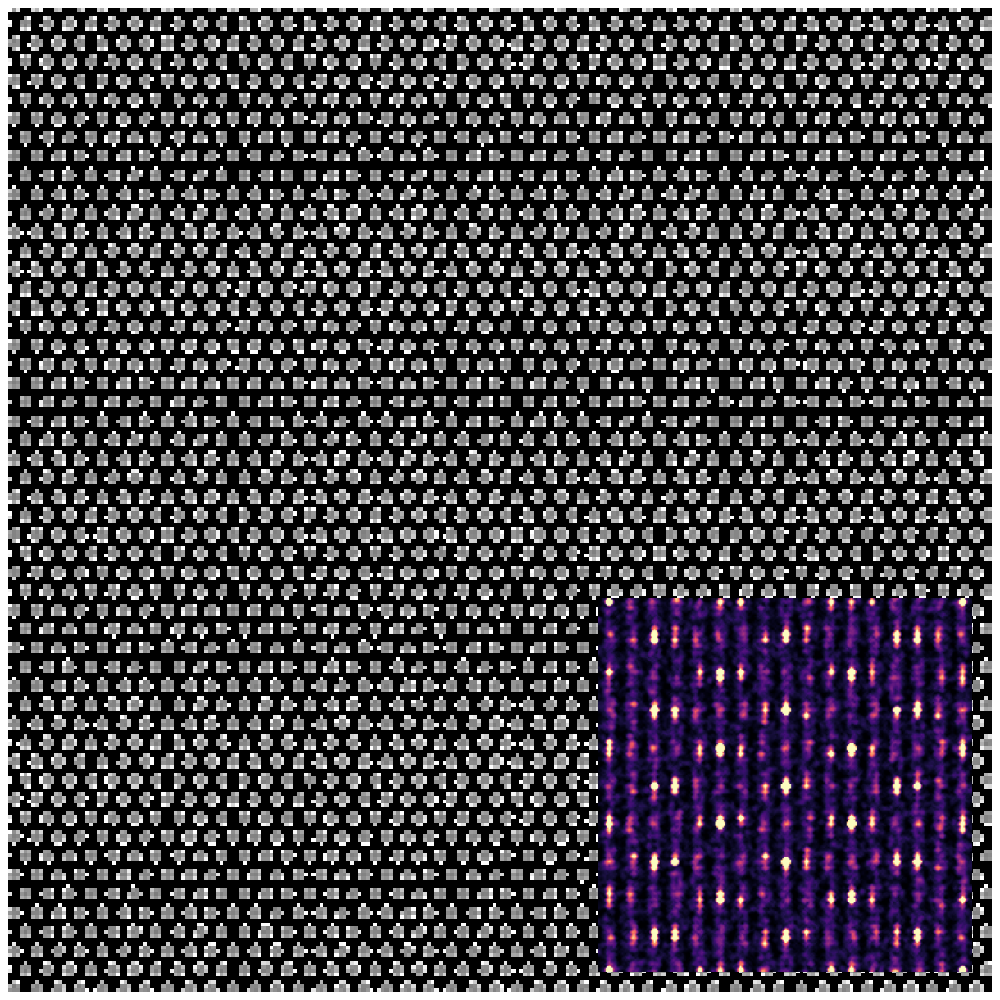

In [11]:
norm_fft = NormalizationConfig(
    interval_type='manual',
    stretch_type='power',
    power=0.5
)

phase = np.angle(-ptycho_pix_reconstruct_6.obj[0]).clip(0)

# Build a 2D Hann window
H, W = phase.shape
window = np.outer(hann(H), hann(W))

phase_windowed = phase * window

fft_mag = np.fft.fftshift(np.abs(np.fft.fft2(phase_windowed)))


fft_mag = np.fft.fftshift(np.abs(np.fft.fft2(phase_windowed)))
fft_mag[H//2, W//2] = 0

# Convolve with small disk — increase radius for more spreading
kernel = disk(2).astype(float)
kernel /= kernel.sum()
fft_mag = convolve(fft_mag, kernel)


rgba_main = real_array_to_rgba(phase)
rgba_fft = real_array_to_rgba(fft_mag, cmap='magma')

# Compose the final figure
fig, ax = plt.subplots(figsize=(12, 12))
ax.imshow(rgba_main,interpolation=None)
ax.axis('off')

# scalebar_real = em.visualization.ScalebarConfig(
#     sampling = ptycho_pix_reconstruct_6.sampling[1],
#     units = 'A',
#     length = 10,
# )

# em.visualization.visualization_utils.add_scalebar_to_ax(
#     ax,
#     ptycho_pix_reconstruct_6.obj[0].shape[1],
#     scalebar_real.sampling,
#     scalebar_real.length,
#     scalebar_real.units,
#     scalebar_real.width_px+2,
#     scalebar_real.pad_px,
#     color='white',
#     loc='lower left',
#     fontsize=26
# )

inset_ax = fig.add_axes([0.60, 0.02, 0.38, 0.38])
inset_ax.imshow(rgba_fft)
inset_ax.axis('off')

fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

# scalebar_real = em.visualization.ScalebarConfig(
#     sampling=dset_6.sampling[3],
#     units='$A^{-1}$',
#     length=1
# )
# em.visualization.visualization_utils.add_scalebar_to_ax(
#     inset_ax,
#     dset_6.shape[3],
#     scalebar_real.sampling,
#     scalebar_real.length,
#     scalebar_real.units,
#     scalebar_real.width_px+1,
#     scalebar_real.pad_px,
#     color='white',
#     loc='lower left',
#     fontsize=16
# )
